In [ ]:
# Running 016um 

In [1]:
# Conda env spatialdata_MM
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
import os
import squidpy as sq
import bin2cell as b2c
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import squidpy as sq
import pandas as pd
# import stlearn as st
import scanpy as sc
import os
import numpy as np
import anndata 
from anndata import AnnData
import matplotlib as mpl
import seaborn as sns; sns.set(color_codes=True)
import matplotlib.pyplot as plt
import scipy.io
import matplotlib.colors as mcolors

In [27]:
# path = "/mnt/scratch2/Maycon/BioHackathon_2024/source_data/VisHD_skin_public/binned_outputs/square_002um"
path = "/mnt/scratch2/Maycon/BioHackathon_2024/source_data/VisHD_skin_public/binned_outputs/square_016um"
#source_image_path = "/mnt/scratch2/Maycon/BioHackathon_2024/source_data/VisHD_skin_public/spatial/tissue_hires_image.tiff"
source_image_path = "/mnt/scratch2/Maycon/BioHackathon_2024/source_data/VisHD_skin_public/binned_outputs/square_016um/spatial/cytassist_image.tiff"

spaceranger_image_path = "/mnt/scratch2/Maycon/BioHackathon_2024/source_data/VisHD_skin_public/spatial"

In [28]:
adata = b2c.read_visium(path, 
                        source_image_path = source_image_path, 
                        spaceranger_image_path = spaceranger_image_path
                       )
adata.var_names_make_unique()
adata

anndata.py (1820): Variable names are not unique. To make them unique, call `.var_names_make_unique`.
anndata.py (1820): Variable names are not unique. To make them unique, call `.var_names_make_unique`.


AnnData object with n_obs × n_vars = 137051 × 18085
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [29]:
sc.pp.filter_cells(adata,  min_genes=100)
sc.pp.filter_genes(adata, min_cells=3)

# Normalizing and clustering 
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, subset=False)
sc.pp.scale(adata, 
max_value=10, 
zero_center=False) # If False the data will not be centered around 0, which can negatively impact techniques like PCA. But I had to set False cause is was returning no markers 
sc.pp.pca(adata, use_highly_variable=True)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
# sc.tl.leiden(adata, resolution=0.2, key_added="leiden_02")
sc.tl.leiden(adata, resolution=0.5, key_added="leiden_05")
# sc.tl.leiden(adata, resolution=1.0, key_added="leiden_1.0")
# sc.tl.leiden(adata, resolution=1.5, key_added="leiden_1.5")


# # Normalizing and clustering - if rapids_singlecell is working 
# rsc.pp.normalize_total(adata)
# rsc.pp.log1p(adata)
# rsc.pp.highly_variable_genes(adata, subset=False)
# rsc.pp.scale(adata, 
# max_value=10, 
# zero_center=False) # If False the data will not be centered around 0, which can negatively impact techniques like PCA. But I had to set False cause is was returning no markers 
# rsc.pp.pca(adata, use_highly_variable=True)
# rsc.pp.neighbors(adata)
# rsc.tl.umap(adata)
# rsc.tl.leiden(adata, resolution=0.2, key_added="leiden_02")
# rsc.tl.leiden(adata, resolution=0.5, key_added="leiden_05")
# rsc.tl.leiden(adata, resolution=1.0, key_added="leiden_1.0")
# rsc.tl.leiden(adata, resolution=1.5, key_added="leiden_1.5")


# Find markers for each cl. resolution 
# sc.tl.rank_genes_groups(adata, 'leiden_02', method='wilcoxon')
# adata.uns['rank_genes_groups_res02'] = adata.uns['rank_genes_groups']

sc.tl.rank_genes_groups(adata, 'leiden_05', method='wilcoxon')
adata.uns['rank_genes_groups_res05'] = adata.uns['rank_genes_groups']

# sc.tl.rank_genes_groups(adata, 'leiden_1.0', method='wilcoxon')
# adata.uns['rank_genes_groups_res1.0'] = adata.uns['rank_genes_groups']

# sc.tl.rank_genes_groups(adata, 'leiden_1.5', method='wilcoxon')
# adata.uns['rank_genes_groups_res1.5'] = adata.uns['rank_genes_groups']

# Save output
adata.write('/mnt/scratch1/maycon/BioHackathon_2024/objects/adata_016um_clustered_05_markersOn_cytassist_image.h5ad')

_pca.py (374): Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
parallel.py (371): The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
auto.py (21): IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
3539895532.py (15): In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.


In [2]:
adata = sc.read_h5ad('/mnt/scratch1/maycon/BioHackathon_2024/objects/adata_016um_clustered_05_markersOn_cytassist_image.h5ad')

_spatial_utils.py (483): The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
_spatial_utils.py (956): No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


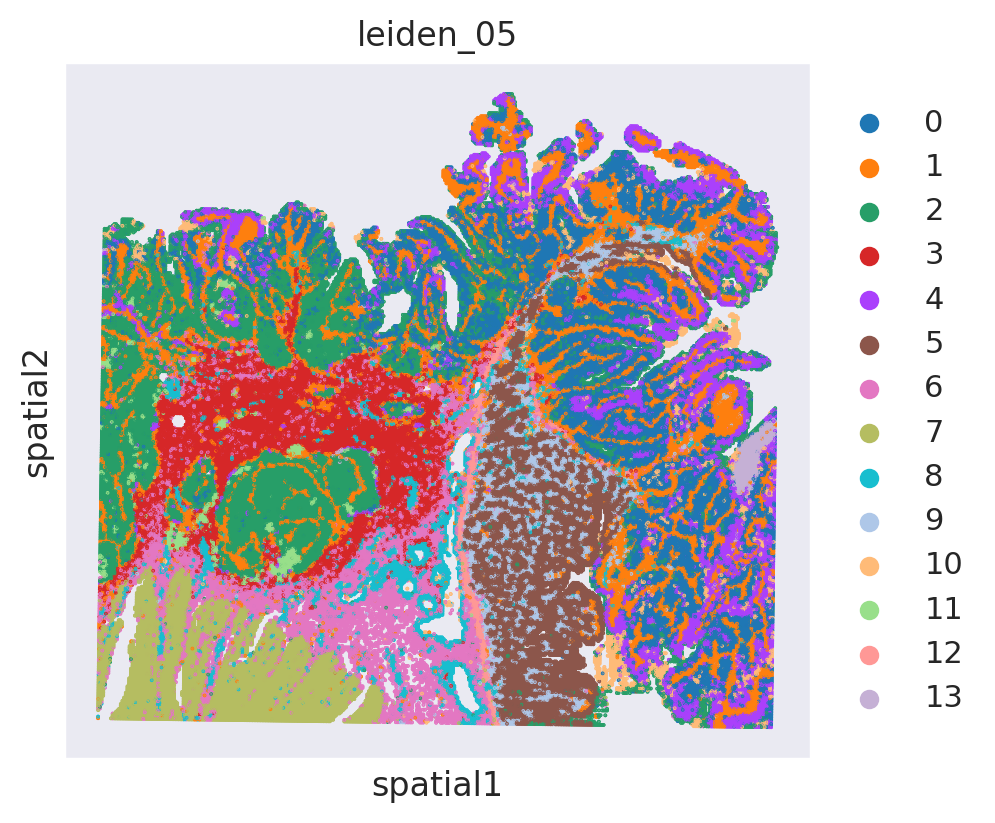

In [13]:
sq.pl.spatial_scatter(adata, shape=None, color=["leiden_05"], size=0.5, figsize=(6, 4))


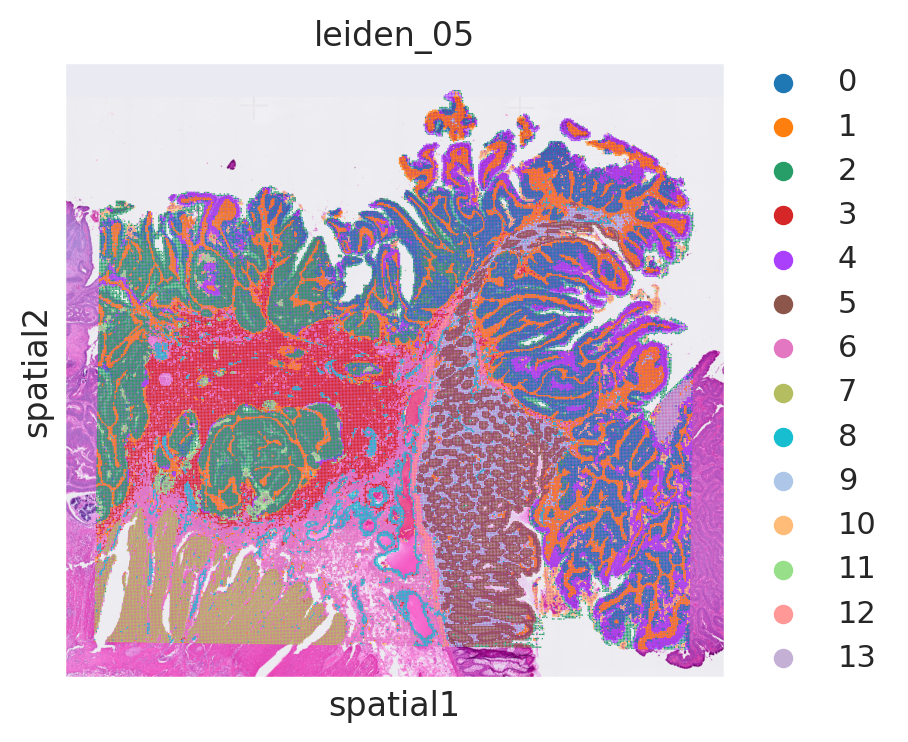

In [12]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (6, 4)  # Adjust the values as needed
sc.pl.spatial(adata, color='leiden_05', size=1)

In [5]:
# Read the parquet file
df_tissue_positions = pd.read_parquet('/mnt/scratch2/Maycon/BioHackathon_2024/source_data/VisHD_skin_public/binned_outputs/square_008um/spatial/tissue_positions.parquet')
# Set the index of the dataframe to the barcodes
df_tissue_positions = df_tissue_positions.set_index('barcode')
df_tissue_positions = df_tissue_positions.reset_index()

# Read cluster-by-pixel labels 
df = pd.read_csv('/mnt/scratch1/maycon/BioHackathon_2024/objects/grid_size_from_cytassist_image.csv')
print(df)
df_clusterBypixel = df.copy()
df_clusterBypixel = df_clusterBypixel.rename(columns={'Start_Row': 'array_row', 'Start_Col': 'array_col'})

# Merge both
merged_data = pd.merge(df_clusterBypixel,df_tissue_positions, on=['array_row', 'array_col'], how='left')
merged_data_cleaned = merged_data.dropna()
merged_data_cleaned = merged_data_cleaned.set_index('barcode')
merged_data_cleaned


# Get it back to adata.obs 
adata.obs = adata.obs.reset_index().merge(merged_data_cleaned.reset_index(), left_index=True, right_index=True, how='left', suffixes=('', '_new')).set_index('index')

adata.obs
adata.obs['Cluster_Label'] = adata.obs['Cluster_Label'].astype(str)


      Grid_Index  Cluster_Label  Mean_Pixel_Value  Start_Row  Start_Col
0              0              5        187.783867          0          0
1              1             67        166.586400          0         50
2              2             45        167.029333          0        100
3              3             89        205.182800          0        150
4              4             22        191.678533          0        200
...          ...            ...               ...        ...        ...
3835        3835             81        220.823333       2950       2950
3836        3836             40        218.199733       2950       3000
3837        3837             40        218.546533       2950       3050
3838        3838             44        215.010400       2950       3100
3839        3839             51        129.478133       2950       3150

[3840 rows x 5 columns]


In [21]:
# # Exporting metadata to Felipinho 
# obs_df = adata.obs
# obs_df.to_csv('/mnt/scratch1/maycon/BioHackathon_2024/objects/metadata_clusters_016um.csv')

In [6]:
# Create a boolean mask for values that are not the string "nan"
non_nan_mask = adata.obs['Cluster_Label'] != "nan"
# Subset adata
adata_subset = adata[non_nan_mask].copy()

In [6]:
adata_subset.obs

,in_tissue,array_row,array_col,n_genes,leiden_05,barcode,Grid_Index,Cluster_Label,Mean_Pixel_Value,array_row_new,array_col_new,in_tissue_new,pxl_row_in_fullres,pxl_col_in_fullres
index,,,,,,,,,,,,,,
s_016um_00010_00367-1,1,10,367,2394,4,s_008um_00000_00000-1,0.0,57.0,238.481200,0.0,0.0,1.0,22367.134394,40609.482784
s_016um_00163_00399-1,1,163,399,1068,13,s_008um_00000_00050-1,1.0,85.0,239.085733,0.0,50.0,1.0,22386.737652,42069.170593
s_016um_00238_00388-1,1,238,388,310,10,s_008um_00000_00100-1,2.0,85.0,238.988267,0.0,100.0,1.0,22406.341906,43528.932591
s_016um_00144_00175-1,1,144,175,433,3,s_008um_00000_00150-1,3.0,57.0,238.338667,0.0,150.0,1.0,22425.947156,44988.768784
s_016um_00347_00254-1,1,347,254,1617,1,s_008um_00000_00200-1,4.0,85.0,239.184267,0.0,200.0,1.0,22445.553403,46448.679176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
s_016um_00258_00078-1,1,258,78,487,10,s_008um_00800_00600-1,1932.0,14.0,238.614267,800.0,600.0,0.0,-761.282324,58434.896847
s_016um_00279_00207-1,1,279,207,275,10,s_008um_00800_00650-1,1933.0,57.0,238.232000,800.0,650.0,0.0,-742.273210,59894.545635
s_016um_00109_00253-1,1,109,253,1287,5,s_008um_00800_00700-1,1934.0,91.0,238.009733,800.0,700.0,0.0,-723.263130,61354.268585


_spatial_utils.py (483): The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
_spatial_utils.py (956): No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
_spatial_utils.py (483): The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
_spatial_utils.py (956): No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


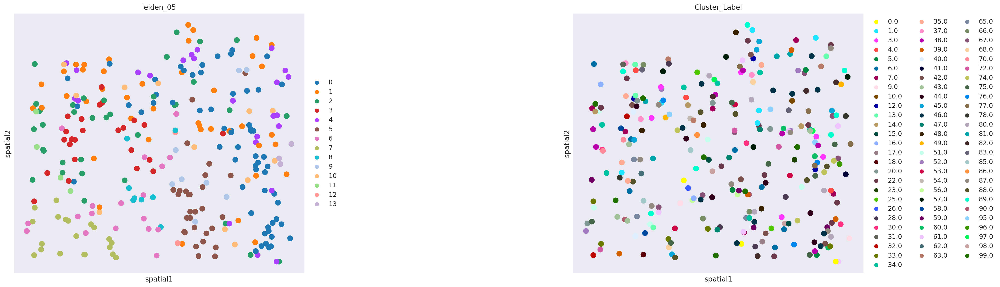

In [7]:
# Left: leiden clusters (from expression); right: cluster-by-pixel (from H&E image)
# *This is a subset based only on barcodes that were found mapped to cluster-by-pixel 
sq.pl.spatial_scatter(adata_subset, shape=None, color=["leiden_05", "Cluster_Label"], size=300, figsize=(15, 8))


In [8]:
# Showing how many barcodes there's by cluster-by-pixel (Cluster_Label)
cluster_counts = adata.obs['Cluster_Label'].value_counts(dropna=False)
print(cluster_counts)

Cluster_Label
nan     126479
46.0        11
22.0        11
34.0         7
99.0         7
         ...  
41.0         1
23.0         1
26.0         1
18.0         1
31.0         1
Name: count, Length: 80, dtype: int64


In [ ]:
# To highlight just one cluster-by-pixel if you want it


# import matplotlib.colors as mcolors
# # Assuming 'Cluster_Label' is the column with cluster labels
# cluster_colors = {"0.0": 'black','other': 'white'}

# # Create the color palette
# pal = [cluster_colors.get(x, 'white') for x in adata_subset.obs['Cluster_Label'].cat.categories]
# pal = mcolors.ListedColormap(pal)

# # plot it
# sq.pl.spatial_scatter(adata_subset, shape=None, color='Cluster_Label', size=0.1, figsize=(15, 8), palette=pal)

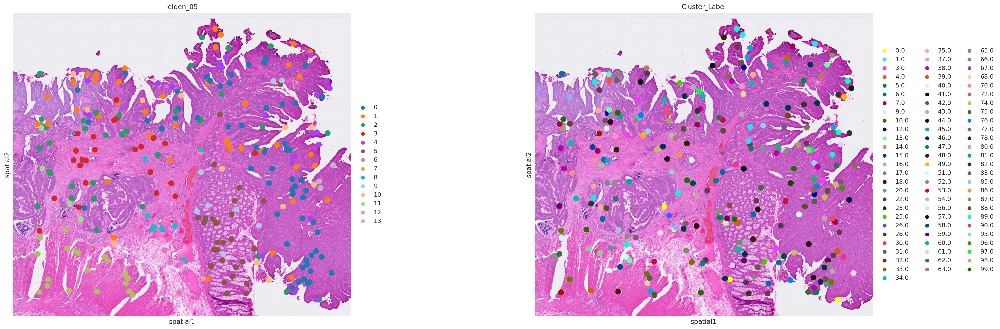

In [9]:
# Plotting it over H&E
sc.pl.spatial(adata_subset, color=['leiden_05', 'Cluster_Label'], size=8)